#####  This data was extracted from the census bureau database found at
##### http://www.census.gov/ftp/pub/DES/www/welcome.html
##### Donor: Ronny Kohavi and Barry Becker,
#####        Data Mining and Visualization
#####        Silicon Graphics.
#####        e-mail: ronnyk@sgi.com for questions.
##### Split into train-test using MLC++ GenCVFiles (2/3, 1/3 random).
##### 48842 instances, mix of continuous and discrete    (train=32561, test=16281)
##### 45222 if instances with unknown values are removed (train=30162, test=15060)
##### Duplicate or conflicting instances : 6
##### Class probabilities for adult.all file
##### Probability for the label '>50K'  : 23.93% / 24.78% (without unknowns)
##### Probability for the label '<=50K' : 76.07% / 75.22% (without unknowns)

##### Extraction was done by Barry Becker from the 1994 Census database.  A set of
#####   reasonably clean records was extracted using the following conditions:
#####   ((AAGE>16) && (AGI>100) && (AFNLWGT>1)&& (HRSWK>0))

##### Prediction task is to determine whether a person makes over 50K
##### a year
 
 Accuracy reported as follows, after removal of unknowns from
    train/test sets):
-    C4.5       : 84.46+-0.30
-    Naive-Bayes: 83.88+-0.30
-   NBTree     : 85.90+-0.28

### Comparison of LogisticRegression, Random Forest, Gradient Boosting and a Keras DNN

### Packages

In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.feature_selection import VarianceThreshold

from sklearn.model_selection import ParameterGrid 

import time

# pip install --upgrade matplotlib graphviz for visualise xgb
# pip install --user  matplotlib graphviz for force to install
# conda install -c anaconda graphviz
# but at first graphviz need to be installed for windows: doenload the msi and run
# https://www2.graphviz.org/Packages/stable/windows/10/msbuild/Release/Win32/
from sklearn import tree

import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.metrics import roc_curve, auc
import shap
# Need to load JS for plotting
shap.initjs()

In [2]:
# graphviz needs to be seen:
import os
#os.environ["PATH"] += os.pathsep + 'C:\\Users\\Gergo\\Anaconda3\\pkgs\\graphviz-2.38-hfd603c8_2\\Library\bin'
os.environ["PATH"] += os.pathsep + 'C:\\Program Files (x86)\\Graphviz2.38\\bin'

### suppress Depreciation Warnings

In [3]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()
    
# Or just simply suppress all of them    
warnings.filterwarnings("ignore")

### Data

In [4]:
path = "c:\\datasets\\UCI_MLRepo\\03_Adult\\adult.data"
columns = ['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship',
           'race','sex','capital-gain','capital-loss','hours-per-week','native-country', 'target_cat']

#age: continuous.
#workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
#fnlwgt: continuous.
#education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
#education-num: continuous.
#marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
#occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
#relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
#race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
#sex: Female, Male.
#capital-gain: continuous.
#capital-loss: continuous.
#hours-per-week: continuous.
#native-country:  United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.


In [5]:
# originally read leading spaces :( so I use this parameter
adult = pd.read_csv(path,header=None, names=columns,skipinitialspace=True)

In [6]:
def target_num(row):
    if row['target_cat'] == '<=50K':
        return 0
    else:
        return 1
#def target_num2(str):
#    if str == '<=50K':
#        return 0
#    else:
#        return 1

#adult.apply(lambda row: target_num2(row['target_cat']), axis=1)    
adult['target'] = adult.apply(lambda row: target_num(row), axis=1)
adult.sample(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target_cat,target
31893,49,Local-gov,78859,Masters,14,Widowed,Prof-specialty,Unmarried,White,Female,0,323,20,United-States,<=50K,0
15022,29,?,112963,Some-college,10,Married-civ-spouse,?,Wife,White,Female,0,0,40,United-States,<=50K,0
19813,35,Private,183800,Bachelors,13,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,>50K,1
12896,37,Private,252947,Bachelors,13,Never-married,Machine-op-inspct,Not-in-family,Black,Male,0,1719,32,United-States,<=50K,0
18615,27,?,251854,Bachelors,13,Married-civ-spouse,?,Wife,Black,Female,0,0,35,?,>50K,1
30650,23,Local-gov,157331,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,40,United-States,<=50K,0
26201,24,Private,179203,12th,8,Never-married,Sales,Other-relative,White,Male,0,0,55,United-States,<=50K,0
26805,37,Private,187346,5th-6th,3,Never-married,Adm-clerical,Other-relative,White,Female,0,0,40,Mexico,<=50K,0
3761,57,Private,170244,Prof-school,15,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,40,United-States,<=50K,0
17903,58,State-gov,300623,HS-grad,9,Divorced,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K,0


## Exploratory Analyisis and Data Preparation and Manipulation

In [7]:
print(adult.shape)

(32561, 16)


In [8]:
missing_val_count_by_column = (adult.isnull().sum())
print("overall ", len(missing_val_count_by_column[missing_val_count_by_column > 0]) , 
      "variables with missing values" , "\nin details:","\n" , 
      missing_val_count_by_column[missing_val_count_by_column > 0])

overall  0 variables with missing values 
in details: 
 Series([], dtype: int64)


In [9]:
## seemingly missing values are ?
from numpy import nan
adult = adult.replace('?',nan)

In [10]:
missing_val_count_by_column = (adult.isnull().sum())
print("overall ", len(missing_val_count_by_column[missing_val_count_by_column > 0]) , 
      "variables with missing values" , "\nin details:","\n" , 
      missing_val_count_by_column[missing_val_count_by_column > 0])

overall  3 variables with missing values 
in details: 
 workclass         1836
occupation        1843
native-country     583
dtype: int64


In [11]:
print('workclass',adult.workclass.unique(),
'\n','education',adult.education.unique(),
'\n','marital-status',adult['marital-status'].unique(),
'\n','occupation',adult.occupation.unique(),
'\n','relationship',adult.relationship.unique(),
'\n','race',adult.race.unique(),
'\n','sex',adult.sex.unique(),
'\n','native-country',adult['native-country'].unique())

workclass ['State-gov' 'Self-emp-not-inc' 'Private' 'Federal-gov' 'Local-gov' nan
 'Self-emp-inc' 'Without-pay' 'Never-worked'] 
 education ['Bachelors' 'HS-grad' '11th' 'Masters' '9th' 'Some-college' 'Assoc-acdm'
 'Assoc-voc' '7th-8th' 'Doctorate' 'Prof-school' '5th-6th' '10th'
 '1st-4th' 'Preschool' '12th'] 
 marital-status ['Never-married' 'Married-civ-spouse' 'Divorced' 'Married-spouse-absent'
 'Separated' 'Married-AF-spouse' 'Widowed'] 
 occupation ['Adm-clerical' 'Exec-managerial' 'Handlers-cleaners' 'Prof-specialty'
 'Other-service' 'Sales' 'Craft-repair' 'Transport-moving'
 'Farming-fishing' 'Machine-op-inspct' 'Tech-support' nan
 'Protective-serv' 'Armed-Forces' 'Priv-house-serv'] 
 relationship ['Not-in-family' 'Husband' 'Wife' 'Own-child' 'Unmarried' 'Other-relative'] 
 race ['White' 'Black' 'Asian-Pac-Islander' 'Amer-Indian-Eskimo' 'Other'] 
 sex ['Male' 'Female'] 
 native-country ['United-States' 'Cuba' 'Jamaica' 'India' nan 'Mexico' 'South'
 'Puerto-Rico' 'Honduras' 'Engl

In [12]:
adult['workclass'].fillna('unknown',inplace = True)
adult['occupation'].fillna('unknown',inplace = True)
adult['native-country'].fillna('unknown',inplace = True)

In [13]:
missing_val_count_by_column = (adult.isnull().sum())
print("overall ", len(missing_val_count_by_column[missing_val_count_by_column > 0]) , 
      "variables with missing values" , "\nin details:","\n" , 
      missing_val_count_by_column[missing_val_count_by_column > 0])

overall  0 variables with missing values 
in details: 
 Series([], dtype: int64)


fnlwgt is a weight, not needed, can be dropped

In [14]:
adult.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,32561,NaN,NaN,NaN,38.5816,13.6404,17,28,37,48,90
workclass,32561,9,Private,22696,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fnlwgt,32561,NaN,NaN,NaN,189778,105550,12285,117827,178356,237051,1.48470e+06
education,32561,16,HS-grad,10501,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,32561,NaN,NaN,NaN,10.0807,2.57272,1,9,10,12,16
marital-status,32561,7,Married-civ-spouse,14976,NaN,NaN,NaN,NaN,NaN,NaN,NaN
occupation,32561,15,Prof-specialty,4140,NaN,NaN,NaN,NaN,NaN,NaN,NaN
relationship,32561,6,Husband,13193,NaN,NaN,NaN,NaN,NaN,NaN,NaN
race,32561,5,White,27816,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sex,32561,2,Male,21790,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
print(adult.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  target_cat      32561 non-null  object
 15  target          32561 non-null  int64 
dtypes: int64(7), object(9)
memory usage: 4.0+ MB
None


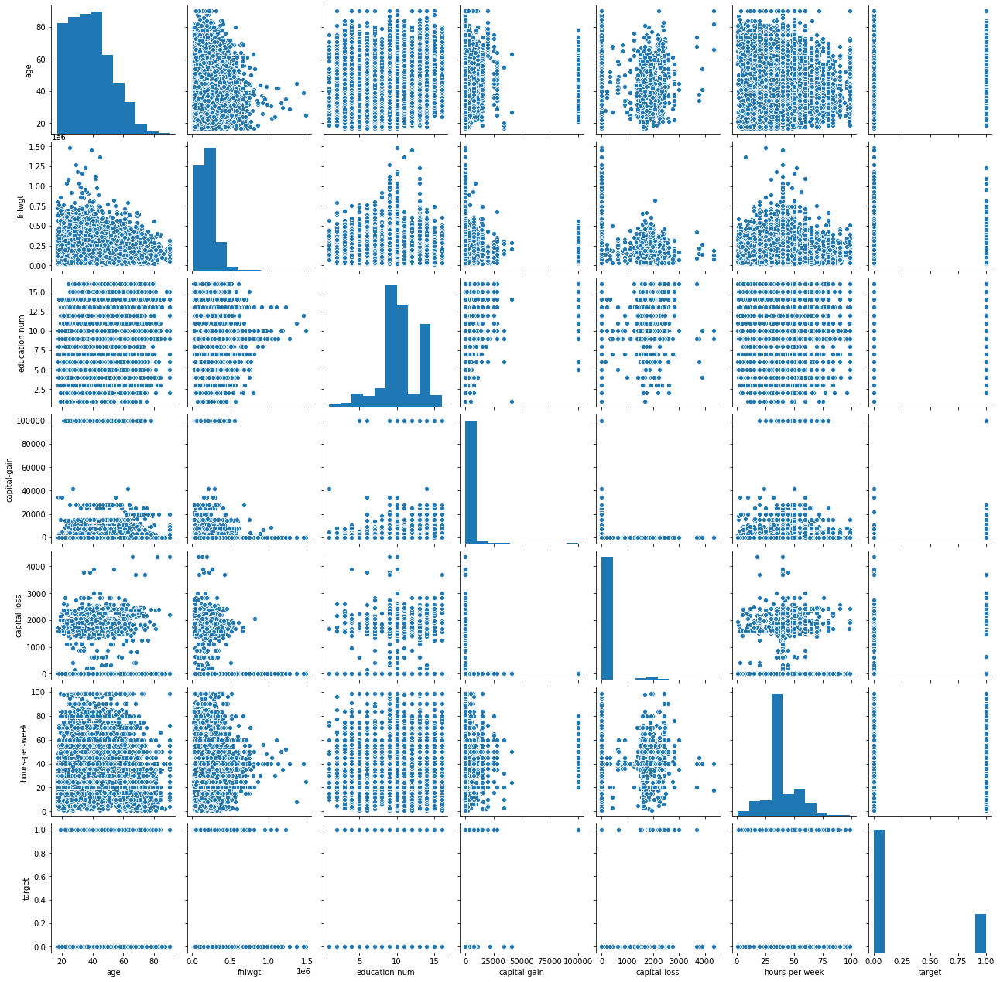

In [16]:
num_columns= [*adult.select_dtypes(['int64', 'float64']).columns]

sns.pairplot(adult[num_columns])
plt.show()

In [17]:
"""Calculate the ratio how balanced is this sample"""

def pc_func(x):
    #2 decimal percentage format 
    return '{:.2%}'.format(x)
print("\nratio:",pc_func(adult[adult.target==1].target.count()/adult.target.count()))


ratio: 24.08%


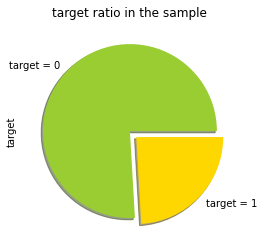

In [18]:
colors = ['yellowgreen', 'gold']
explode = (0, 0.1)
labels = 'target = 0','target = 1' 
values = adult['target'].value_counts()
values.plot(kind='pie',explode = explode, title='target ratio in the sample',colors=colors,shadow=True, labels = labels)
plt.show()

In [19]:
#split the tale into feature matrix and target vector
y = adult.loc[:,['target']]
X = adult.drop(columns=['target_cat','target'])
columns = X.columns

In [20]:
Xd = pd.get_dummies(X)
#X_train, X_test, y_train, y_test = train_test_split(Xd, y, test_size=0.3, random_state=0)
columnsd = Xd.columns
print(X.shape, Xd.shape)

(32561, 14) (32561, 108)


occupation and native country created a lots of features:(

In [21]:
Xd.var().sort_values()

native-country_Holand-Netherlands    3.071159e-05
workclass_Never-worked               2.149415e-04
occupation_Armed-Forces              2.763364e-04
native-country_Scotland              3.684145e-04
native-country_Honduras              3.991035e-04
                                         ...     
hours-per-week                       1.524590e+02
age                                  1.860614e+02
capital-loss                         1.623769e+05
capital-gain                         5.454254e+07
fnlwgt                               1.114080e+10
Length: 108, dtype: float64

In [22]:
Xd = Xd.drop('fnlwgt', axis=1)

## Low variance features dropping

In [23]:
print('before shape:',Xd.shape)
selector = VarianceThreshold(threshold=.1)
#selector = VarianceThreshold(threshold=.01)
#selector = VarianceThreshold()
selector.fit(Xd)
X2 = Xd[Xd.columns[selector.get_support(indices=True)]]
X2c=X2.columns.values.tolist()
Xd = Xd[X2c]
print('after shape:',Xd.shape)

before shape: (32561, 107)
after shape: (32561, 22)


### Correlations

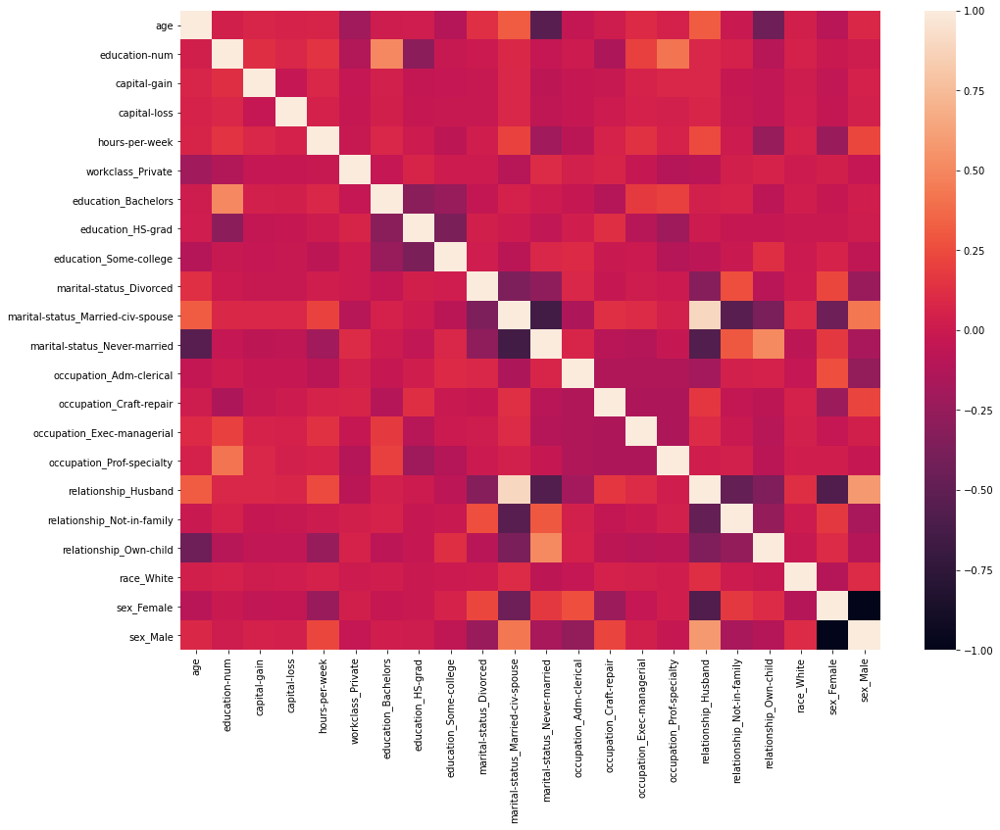

In [24]:
#CORRELATION HEATMAP
import seaborn as sns
fig, ax = plt.subplots(figsize=[16,12])
sns.heatmap(Xd.corr())
plt.show()

In [25]:
#CORRELATION MATRIX with values
corr = Xd.corr()
corr.style.background_gradient()

,age,education-num,capital-gain,capital-loss,hours-per-week,workclass_Private,education_Bachelors,education_HS-grad,education_Some-college,marital-status_Divorced,marital-status_Married-civ-spouse,marital-status_Never-married,occupation_Adm-clerical,occupation_Craft-repair,occupation_Exec-managerial,occupation_Prof-specialty,relationship_Husband,relationship_Not-in-family,relationship_Own-child,race_White,sex_Female,sex_Male
age,1.000000,0.036527,0.077674,0.057775,0.068756,-0.198388,0.010516,0.019870,-0.111262,0.129975,0.315679,-0.534359,-0.042902,0.012515,0.099352,0.054170,0.316875,-0.010106,-0.432918,0.033412,-0.088832,0.088832
education-num,0.036527,1.000000,0.122630,0.079923,0.148123,-0.118484,0.503435,-0.289817,-0.016845,-0.007771,0.086078,-0.032109,0.004620,-0.143073,0.200923,0.419006,0.078848,0.053430,-0.099213,0.051353,-0.012280,0.012280
capital-gain,0.077674,0.122630,1.000000,-0.031615,0.078409,-0.038701,0.040769,-0.046791,-0.034826,-0.018798,0.085873,-0.066334,-0.028502,-0.022000,0.060618,0.085222,0.080175,-0.026489,-0.053601,0.014429,-0.048480,0.048480
capital-loss,0.057775,0.079923,-0.031615,1.000000,0.054256,-0.027460,0.034183,-0.028829,-0.020884,-0.022396,0.080466,-0.060623,-0.023806,0.001094,0.048311,0.046255,0.075491,-0.017299,-0.050922,0.021044,-0.045567,0.045567
hours-per-week,0.068756,0.148123,0.078409,0.054256,1.000000,-0.020928,0.078207,0.007707,-0.068960,0.026052,0.212817,-0.197936,-0.084378,0.057375,0.139208,0.060253,0.246164,0.007498,-0.249254,0.049345,-0.229309,0.229309
workclass_Private,-0.198388,-0.118484,-0.038701,-0.027460,-0.020928,1.000000,-0.032739,0.065837,0.001916,0.004302,-0.094767,0.105278,0.042859,0.068070,-0.028935,-0.114891,-0.084935,0.033295,0.061656,0.002919,0.034699,-0.034699
education_Bachelors,0.010516,0.503435,0.040769,0.034183,0.078207,-0.032739,1.000000,-0.306098,-0.238308,-0.044578,0.050707,0.006717,-0.029523,-0.111921,0.175511,0.202470,0.044430,0.056859,-0.070958,0.025211,-0.026837,0.026837
education_HS-grad,0.019870,-0.289817,-0.046791,-0.028829,0.007707,0.065837,-0.306098,1.000000,-0.370598,0.034476,0.002004,-0.049858,0.030630,0.118851,-0.100230,-0.217372,0.003242,-0.024325,-0.023641,-0.012425,-0.011684,0.011684
education_Some-college,-0.111262,-0.016845,-0.034826,-0.020884,-0.068960,0.001916,-0.238308,-0.370598,1.000000,0.015910,-0.079143,0.084870,0.100580,-0.011069,-0.007009,-0.109915,-0.072055,-0.010587,0.119939,-0.004491,0.061722,-0.061722
marital-status_Divorced,0.129975,-0.007771,-0.018798,-0.022396,0.026052,0.004302,-0.044578,0.034476,0.015910,1.000000,-0.366837,-0.277772,0.085166,-0.025707,0.013312,-0.006958,-0.328077,0.260828,-0.089719,0.000371,0.228621,-0.228621


looks fine, not very strong correlations

### Dropping Strongly Correlated Variables

In [26]:
#I put this step to the beginning to filter the strongly correlated ones
#so the RFE may take shorter
#drop highly correlated variables
# Create correlation matrix (absolute values make things easier)
import time
start_time = time.time()
corr = Xd.corr()
corr_matrix = corr.abs()

# Select upper triangle of correlation matrix (just one direction is enough)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

# Drop features 
X2 = Xd.drop(to_drop, axis=1)
#New feature list
X2c=X2.columns.values.tolist()

def d2_func(x):
    #2 decimal percentage format 
    return '{:.2f}'.format(x)
print("This run took", d2_func(time.time() - start_time), " seconds to run")
print("New list:",X2c,"\nDrop list:",to_drop)
print(len(to_drop),"features were dropped","\n",len(X2c),"features remained")

This run took 0.23  seconds to run
New list: ['age', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week', 'workclass_Private', 'education_Bachelors', 'education_HS-grad', 'education_Some-college', 'marital-status_Divorced', 'marital-status_Married-civ-spouse', 'marital-status_Never-married', 'occupation_Adm-clerical', 'occupation_Craft-repair', 'occupation_Exec-managerial', 'occupation_Prof-specialty', 'relationship_Not-in-family', 'relationship_Own-child', 'race_White', 'sex_Female'] 
Drop list: ['relationship_Husband', 'sex_Male']
2 features were dropped 
 20 features remained


In [27]:
y = y['target']

### Recursive Feature Elimination

In [28]:
# Recursive Feature Elimination : it takes for a while to run for big data
# here I randomly select the top 25 so no change
# notes: ravel is not necessary it just flatten the array, can use other tech, not only log reg if you want
from sklearn.feature_selection import RFE

start_time = time.time()

Xc=X2.columns.values.tolist()
yc=['target']
#define solver to prevent warnings
#logreg = LogisticRegression(solver = 'liblinear')
logreg = LogisticRegression(solver = 'sag')
rfe = RFE(logreg, 25)
rfe = rfe.fit(X2, y.values.ravel())
print("This run took", time.time() - start_time, "to run")
print(Xc)
print(rfe.support_)
print(rfe.ranking_)

This run took 4.954236030578613 to run
['age', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week', 'workclass_Private', 'education_Bachelors', 'education_HS-grad', 'education_Some-college', 'marital-status_Divorced', 'marital-status_Married-civ-spouse', 'marital-status_Never-married', 'occupation_Adm-clerical', 'occupation_Craft-repair', 'occupation_Exec-managerial', 'occupation_Prof-specialty', 'relationship_Not-in-family', 'relationship_Own-child', 'race_White', 'sex_Female']
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [29]:
#KEEP THE SELECTED FEATURES ONLY: newXd
#Value list to numpy array to process, then change back to list, after the filter
Xcnp = np.array(Xc)
my_filter = np.array(rfe.support_, dtype=bool)
new_Xc = Xcnp[my_filter].tolist()
newX = X2[new_Xc]

<Figure size 432x288 with 0 Axes>

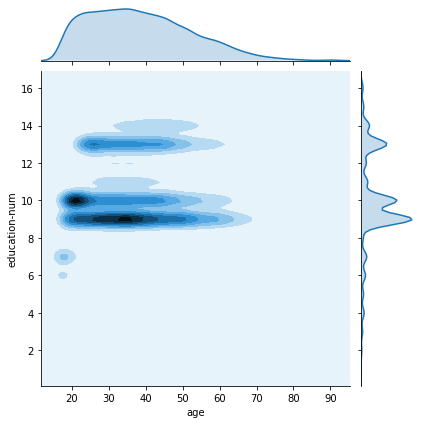

In [30]:
#nice visualization to check correlated variables
#flt = (newXd.i_age>18) & (newXd.i_ele_consumption_eac<10000)& (newXd.i_ele_consumption_eac>-1000)
#newXd_G=newXd[flt]
plt.clf()
gt = sns.jointplot(x='age',y='education-num',data =newX, kind= 'kde' )
plt.show()

### P value analysis

In [31]:
#P value analysis - I use this to get the p values and then drop those where the p value is too big
#2 or 3 iteration will be enough to drop the big p values
import statsmodels.api as sm
logit_model=sm.Logit(y,newX)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.366239
         Iterations 9
                                  Results: Logit
Model:                     Logit                 Pseudo R-squared:      0.337     
Dependent Variable:        target                AIC:                   23890.2345
Date:                      2020-08-07 10:33      BIC:                   24058.0519
No. Observations:          32561                 Log-Likelihood:        -11925.   
Df Model:                  19                    LL-Null:               -17974.   
Df Residuals:              32541                 LLR p-value:           0.0000    
Converged:                 1.0000                Scale:                 1.0000    
No. Iterations:            9.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-------------------

In [32]:
#2 dicitionaries: coef value and pvalue
# coefficients just in case, I won't use them
coef = []
coefficients = result.params
for v in new_Xc:
    coef.append(coefficients[v])
col_dict = dict(zip(new_Xc, coef))

#Drop where the p value is too big
pvalue = result.pvalues
fil = result.pvalues <=0.05
newXc_np = np.array(new_Xc)
final_featuresX = newXc_np[fil.tolist()].tolist()
final_featuresX

finalX=newX[final_featuresX]
print("remaining feature number:" ,len(final_featuresX))

# without p value analysis
#finalX = newX
#final_featuresX = new_Xc

remaining feature number: 17


singular matrix error, so let's see

In [33]:
finalX.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   age                           32561 non-null  int64
 1   education-num                 32561 non-null  int64
 2   capital-gain                  32561 non-null  int64
 3   capital-loss                  32561 non-null  int64
 4   workclass_Private             32561 non-null  uint8
 5   education_Bachelors           32561 non-null  uint8
 6   education_HS-grad             32561 non-null  uint8
 7   education_Some-college        32561 non-null  uint8
 8   marital-status_Divorced       32561 non-null  uint8
 9   marital-status_Never-married  32561 non-null  uint8
 10  occupation_Adm-clerical       32561 non-null  uint8
 11  occupation_Exec-managerial    32561 non-null  uint8
 12  occupation_Prof-specialty     32561 non-null  uint8
 13  relationship_Not-in-family    3

In [34]:
#Multicolinearity is hard to detect because it emerges when three or more variables, 
#which are highly correlated, are included within a model. To make matters worst multicolinearity can emerge 
#even when isolated pairs of variables are not colinear.
#So the correlation matrix above was not enough

from statsmodels.stats.outliers_influence import variance_inflation_factor    

def calculate_vif_(X, thresh=5.0):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(X.columns[variables])
    low_VIF = X.columns[variables]
    return low_VIF


low_VIF = calculate_vif_(finalX, thresh=5.0)

dropping 'education-num' at index: 1
dropping 'age' at index: 0
Remaining variables:
Index(['capital-gain', 'capital-loss', 'workclass_Private',
       'education_Bachelors', 'education_HS-grad', 'education_Some-college',
       'marital-status_Divorced', 'marital-status_Never-married',
       'occupation_Adm-clerical', 'occupation_Exec-managerial',
       'occupation_Prof-specialty', 'relationship_Not-in-family',
       'relationship_Own-child', 'race_White', 'sex_Female'],
      dtype='object')


#### ok, so because of the collinearity we dropped another 2

In [35]:
finalX_VIF = finalX[low_VIF]
final_featuresX = low_VIF.tolist()
print(final_featuresX, len(final_featuresX))

['capital-gain', 'capital-loss', 'workclass_Private', 'education_Bachelors', 'education_HS-grad', 'education_Some-college', 'marital-status_Divorced', 'marital-status_Never-married', 'occupation_Adm-clerical', 'occupation_Exec-managerial', 'occupation_Prof-specialty', 'relationship_Not-in-family', 'relationship_Own-child', 'race_White', 'sex_Female'] 15


## START THE SKLEARN LOGISTIC MODEL

In [66]:
#again I use ravel() because this is what the model expect - works without it, but sends warning
from sklearn import metrics
X_train, X_test, y_train, y_test = train_test_split(finalX_VIF, y.values.ravel(), test_size=0.3, random_state=0)
logreg = LogisticRegression(solver = 'liblinear')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.84


In [37]:
#features & coefficients & target list (as string)
target_names = []
for n in logreg.classes_.tolist(): 
    target_names.append(str(n))
print('target names:',target_names)
logreg_features = final_featuresX
coef = logreg.coef_[0].tolist()
coef_dict = dict(zip(final_featuresX, coef))
#interception
coef_dict["interception"] = logreg.intercept_[0].tolist()
print('\ncoefficients:',coef_dict)

target names: ['0', '1']

coefficients: {'capital-gain': 0.0003172806506081988, 'capital-loss': 0.0006903454060945302, 'workclass_Private': -0.019792600451582192, 'education_Bachelors': 0.5950379539976508, 'education_HS-grad': -0.371711473600292, 'education_Some-college': -0.019332098389786338, 'marital-status_Divorced': -1.2286865867635837, 'marital-status_Never-married': -1.8688037823170613, 'occupation_Adm-clerical': 0.33049601498878567, 'occupation_Exec-managerial': 1.2237229894747306, 'occupation_Prof-specialty': 1.270308614938162, 'relationship_Not-in-family': -0.5868947093592415, 'relationship_Own-child': -1.5502469014150964, 'race_White': 0.2815206945405028, 'sex_Female': -0.8293166458146725, 'interception': -1.150444104718389}


### Evaluation

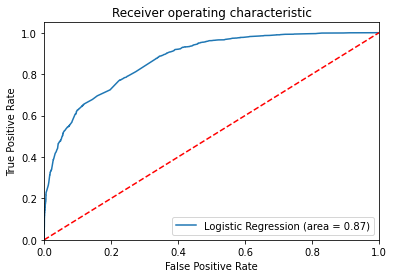

In [38]:
#ROC CURVE

logit_roc_auc = roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

#### Parameter Tuning

optimize with regards to AUC, then to accuracy

This run took 2.198826313018799 to run


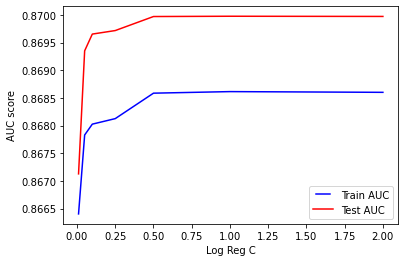

In [39]:
#check how the C value changes the AUC
#C is our regularization parameter: C = 1/λ.
# λ controls the trade-off between allowing the model to increase 
# its complexity as much as it wants with trying to keep it simple. 
# For example, if λ is very low or 0, the model will have enough power to increase it's complexity (overfit)
# by assigning big values to the weights for each parameter. 
# If, in the other hand, we increase the value of λ, the model will tend to underfit, as the model will become too simple
start_time = time.time()

C = [2, 1, 0.5, 0.25, 0.1, 0.05, 0.01]
train_results = []
test_results = []
for c in C:
   model = LogisticRegression(C=c, solver = 'liblinear')
   model.fit(X_train, y_train)
   train_pred = model.predict_proba(X_train)[:,1]
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = model.predict_proba(X_test)[:,1]
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
    
print("This run took", time.time() - start_time, "to run")
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(C, train_results, 'b', label='Train AUC')
line2, = plt.plot(C, test_results, 'r', label='Test AUC')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Log Reg C')
plt.show()

<div class="alert alert-block alert-info">
 C evaluation: 0.5 seems the right one
 <br>AUC ~ 0.87
</div>

In [40]:
test_results

[0.8699721594340526,
 0.8699756460779772,
 0.8699704446911388,
 0.8697170056884882,
 0.8696533315682913,
 0.8693511367087934,
 0.8671275724144507]

In [41]:
logreg = LogisticRegression(solver = 'liblinear', C=0.5)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.84


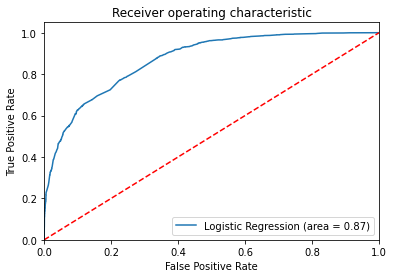

0.8699704446911388


In [42]:
#ROC CURVE
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
logit_roc_auc = roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()
print(logit_roc_auc)

the same as before, but now let's optimize accuracy

This run took 2.147392749786377 to run


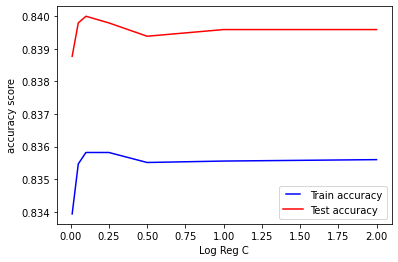

In [43]:
#check how the C value changes the Accuracy
#C is our regularization parameter: C = 1/λ.
# λ controls the trade-off between allowing the model to increase 
# its complexity as much as it wants with trying to keep it simple. 
# For example, if λ is very low or 0, the model will have enough power to increase it's complexity (overfit)
# by assigning big values to the weights for each parameter. 
# If, in the other hand, we increase the value of λ, the model will tend to underfit, as the model will become too simple
start_time = time.time()

C = [2, 1, 0.5, 0.25, 0.1, 0.05, 0.01]
train_results = []
test_results = []
for c in C:
   model = LogisticRegression(C=c, solver = 'liblinear')
   model.fit(X_train, y_train)
   score = model.score(X_train, y_train)
   train_results.append(score)
   score = model.score(X_test, y_test)
   test_results.append(score)
    
print("This run took", time.time() - start_time, "to run")
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(C, train_results, 'b', label='Train accuracy')
line2, = plt.plot(C, test_results, 'r', label='Test accuracy')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('accuracy score')
plt.xlabel('Log Reg C')
plt.show()

0.1 seems a logical choice if we want

### with the c parameter manipulation I managed to improve the Gini and accuracy

In [45]:
#without crossvalidation

grid = {"C": [2, 1, 0.5, 0.25, 0.1, 0.05],
    "dual": [False],
    "max_iter": [80, 100,110,120,130,140],
    "random_state":[1971]} 

lrc = LogisticRegression()
#from pprint import pprint 
#pprint(list(ParameterGrid(grid)))

In [46]:
# Maximise the AUC

test_scores = [] 
# loop through the parameter grid, set hyperparameters, save the scores 
for g in ParameterGrid(grid): 
    lrc.set_params(**g)  # ** is "unpacking" the dictionary 
    lrc.fit(X_train, y_train)
    yg_pred = lrc.predict_proba(X_test)[:,1]
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
    roc_aucg = auc(false_positive_rate, true_positive_rate)
    test_scores.append(roc_aucg) # find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores) 
print(test_scores[best_idx]) 
print(ParameterGrid(grid)[best_idx]) 

0.86999845215873
{'random_state': 1971, 'max_iter': 140, 'dual': False, 'C': 1}


In [68]:
logreg2 = LogisticRegression(C=1,max_iter = 140,random_state=1971 , dual=False)
logreg2.fit(X_train, y_train)
y_pred = logreg2.predict(X_test)
yg_pred = logreg2.predict_proba(X_test)[:,1]
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg2.score(X_test, y_test)))
print('AUC on test set: {:.2f}'.format(auc(false_positive_rate, true_positive_rate)))

Accuracy of logistic regression classifier on test set: 0.84
AUC on test set: 0.87


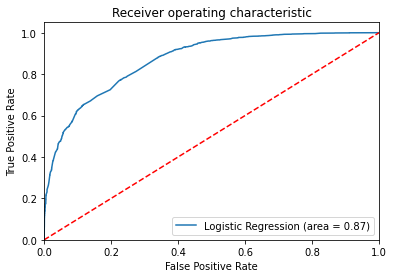

0.86999845215873


In [69]:
#ROC CURVE
logit_roc_auc = roc_auc_score(y_test, logreg2.predict_proba(X_test)[:,1])
fpr_log, tpr_log, thresholds_log = roc_curve(y_test, logreg2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr_log, tpr_log, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()
print(logit_roc_auc)

## SAVING MODELS

In [51]:
with open('adult_logreg.pickle', 'wb') as handle:
    pickle.dump(logreg2, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# now we use the saved modell, so no need to rerun everything
#with open('logreg1.pickle', 'rb') as handle:
#    logreg = pickle.load(handle)

#### Shap for logistic regression

first: a random prediction - we can see the independent features and the predicted probability

In [46]:
# as for log reg and the rest I use different X_train - it's easier this way
X_train, X_test, y_train, y_test = train_test_split(finalX_VIF, y.values.ravel(), test_size=0.3, random_state=0)

i=18
print(X_test.iloc[i],logreg2.predict_proba(X_test)[:,1][i])

capital-gain                    1409
capital-loss                       0
workclass_Private                  0
education_Bachelors                0
education_HS-grad                  1
education_Some-college             0
marital-status_Divorced            0
marital-status_Never-married       0
occupation_Adm-clerical            0
occupation_Exec-managerial         0
occupation_Prof-specialty          0
relationship_Not-in-family         0
relationship_Own-child             0
race_White                         1
sex_Female                         0
Name: 9907, dtype: int64 0.3133296793284255


In [47]:
# use Kernel SHAP to explain test set predictions
# to avoid too much calculations I used shap.sample(X_train, 50) instead of simply X_train
# still takes around 45 minutes on my machine
explainer = shap.KernelExplainer(logreg.predict_proba, shap.sample(X_train, 50), link="logit")
#explainer = shap.KernelExplainer(logreg.predict_proba, X_train, link="logit")
shap_values = explainer.shap_values(X_test, nsamples=200)

In [48]:
# plot the SHAP values for the output of any cases
# this is the same as you cansee above
shap.force_plot(explainer.expected_value[1], shap_values[1][18,:], X_test.iloc[18,:], link="logit")

In [49]:
shap.force_plot(explainer.expected_value[1], shap_values[1][:,:], X_test.iloc[:,:], link="logit")

In [50]:
shap_values[0][0,:]

array([ 0.31495906,  0.10363127,  0.        ,  0.11002421, -0.09943717,
        0.0201303 ,  0.90450558, -0.31873637, -0.23167206,  0.08681321,
        0.30521336, -0.12515013, -0.11072444, -0.04730603,  0.4802325 ])

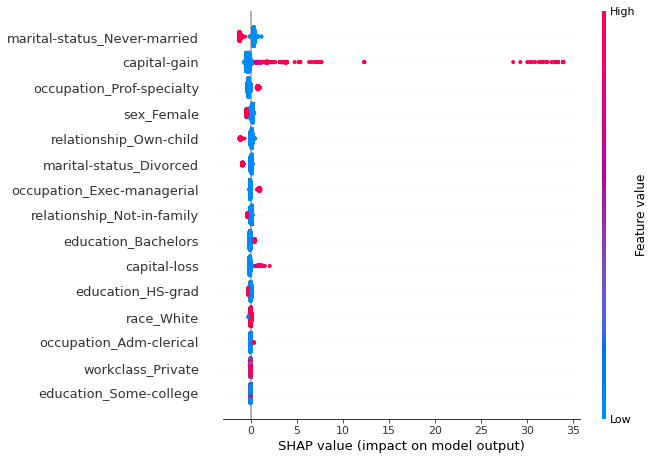

In [51]:
# plot the SHAP values for the all instances
shap.summary_plot(shap_values[1][:,:], features=X_test, feature_names=X_test.columns)

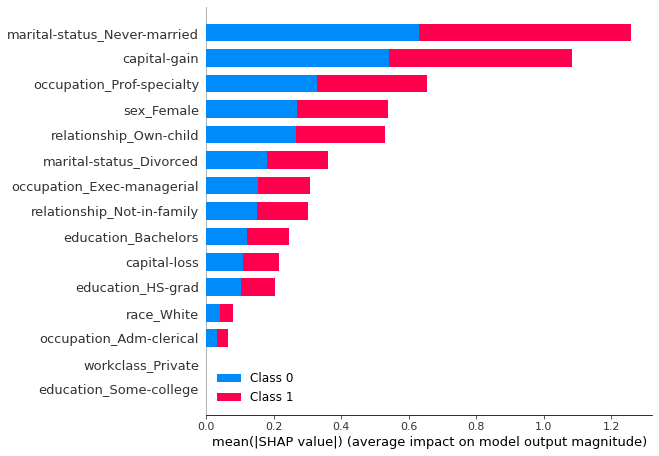

In [52]:
shap.summary_plot(shap_values, features=X_test, feature_names=X_test.columns)

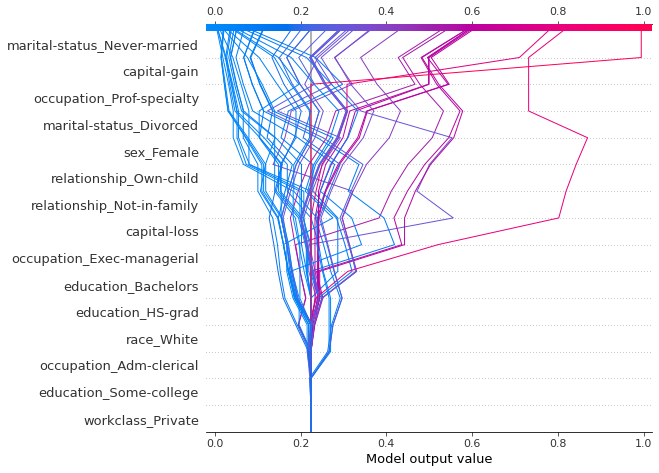

In [53]:
# 50 sample
shap.decision_plot(explainer.expected_value[1], shap_values[1][:50,:], X_test.columns, link='logit')
# https://slundberg.github.io/shap/notebooks/plots/decision_plot.html

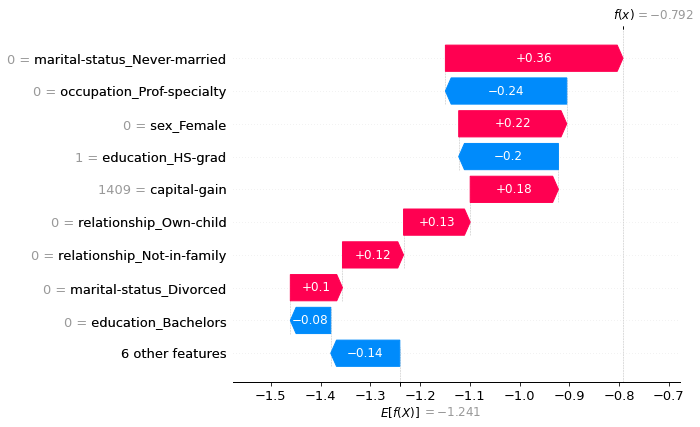

In [54]:
shap.waterfall_plot(explainer.expected_value[1], shap_values[1][18,:], X_test.iloc[18,:], X_test.columns)

#https://shap.readthedocs.io/en/latest/

### with only 2 features in this model it's enough, the rest of the models seem more interesting

## GRADIENT BOOSTING

let's use the variables without really filtering out : newX, new_Xc although we could go further, but it's fine for this POC

In [62]:
X_train, X_test, y_train, y_test = train_test_split(newX, y.values.ravel(), test_size=0.4, random_state=42)
#Crossvalidation and parameter tuning in the same time - can be used the whole Xd and y
GBmodel = GradientBoostingClassifier(random_state=1971)
GBmodel.fit(X_train, y_train)
# predic calssifies, predict_proba gives probabilities
yg_pred = GBmodel.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
roc_aucg = auc(false_positive_rate, true_positive_rate)
print("AUC:",roc_aucg)
print("Accuracy:",GBmodel.score(X_test, y_test))

AUC: 0.9191106942383849
Accuracy: 0.8638003838771593


#### huge leap compared to the logistic regression

## hyperparameters
- learning_rate = This determines the impact of each tree on the final outcome, lower values are generally preferred as they make the model robust
- n_estimators = number of trees in the foreset
- max_features = max number of features considered for splitting a node
- max_depth = max number of levels in each decision tree
- min_samples_split = min number of data points placed in a node before the node is split
- min_samples_leaf = min number of data points allowed in a leaf node
- subsample = The fraction of observations to be selected for each tree

In [65]:
#recreated the grid to have a chance for better results


grid = {    #"loss":["deviance"],
    "learning_rate": [0.1,0.25],
    "min_samples_split": [0.01,0.05],# let them very low - dodgy but works
    "min_samples_leaf": [0.01, 0.05],
    "max_depth":[2,3],
    "max_features":["log2","sqrt",None],
    #"criterion": ["friedman_mse"],
    "subsample":[0.8, 1.0],
    "n_estimators":[80, 100, 150],
    "random_state":[1971]} 
# decreased to only 288 models check

gbc = GradientBoostingClassifier()
#from pprint import pprint 
#pprint(list(ParameterGrid(grid)))

### optimum by accuracy

In [66]:
test_scores = [] 
# loop through the parameter grid, set hyperparameters, save the scores 
for g in ParameterGrid(grid): 
    gbc.set_params(**g)  # ** is "unpacking" the dictionary 
    gbc.fit(X_train, y_train)
    test_scores.append(gbc.score(X_test, y_test)) # find best hyperparameters from the test score and print 
best_idx = np.argmax(test_scores) 
print(test_scores[best_idx]) 
print(ParameterGrid(grid)[best_idx]) 

0.8649520153550864
{'subsample': 1.0, 'random_state': 1971, 'n_estimators': 150, 'min_samples_split': 0.05, 'min_samples_leaf': 0.01, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.25}


### optimum by gini

In [67]:
# optimum by gini
test_scores = [] 
# loop through the parameter grid, set hyperparameters, save the scores 
for g in ParameterGrid(grid): 
    gbc.set_params(**g)  # ** is "unpacking" the dictionary 
    gbc.fit(X_train, y_train)
    yg_pred = gbc.predict_proba(X_test)[:,1]
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
    roc_aucg = auc(false_positive_rate, true_positive_rate)
    test_scores.append(roc_aucg) # find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores) 
print(test_scores[best_idx]) 
print(ParameterGrid(grid)[best_idx]) 

0.919989571006753
{'subsample': 1.0, 'random_state': 1971, 'n_estimators': 150, 'min_samples_split': 0.01, 'min_samples_leaf': 0.01, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.25}


### THE CHOSEN ONE:

In [63]:
GBmodel3 = GradientBoostingClassifier(max_depth=3, n_estimators=150, learning_rate=0.25, subsample = 1.0, 
                                      random_state=1971,max_features=None, min_samples_split=0.01, 
                                      min_samples_leaf=0.01 )
GBmodel3.fit(X_train, y_train)
yg_pred3 = GBmodel3.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred3)
roc_aucg3 = auc(false_positive_rate, true_positive_rate)
print('ROC_AUC:',roc_aucg3, '\nAccuracy:',GBmodel3.score(X_test, y_test))

ROC_AUC: 0.9198390001146973 
Accuracy: 0.8660047087726481


In [69]:
GBmodel4 = GradientBoostingClassifier(max_depth=3, n_estimators=150, learning_rate=0.25, subsample = 1.0, 
                                      random_state=1971,max_features=None, min_samples_split=0.05, 
                                      min_samples_leaf=0.01 )
GBmodel4.fit(X_train, y_train)
yg_pred4 = GBmodel4.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred4)
roc_aucg4 = auc(false_positive_rate, true_positive_rate)
print('ROC_AUC:',roc_aucg4, '\nAccuracy:',GBmodel4.score(X_test, y_test))

ROC_AUC: 0.9188389430877246 
Accuracy: 0.8649520153550864


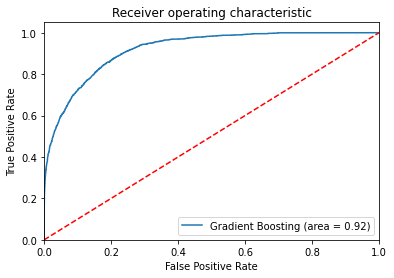

0.9198390001146973


In [64]:
#GB ROC CURVE
gb_roc_auc = roc_auc_score(y_test, GBmodel3.predict_proba(X_test)[:,1])
fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test, GBmodel3.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (area = %0.2f)' % gb_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('GB_ROC')
plt.show()
print(gb_roc_auc)

In [71]:
print(GBmodel3.predict_proba(np.array(X_train.iloc[10,:]).reshape(1, -1))[:,1])
print(X_train.iloc[10,:])

[0.01656511]
age                                  25
education-num                        10
capital-gain                          0
capital-loss                          0
hours-per-week                       50
workclass_Private                     1
education_Bachelors                   0
education_HS-grad                     0
education_Some-college                1
marital-status_Divorced               0
marital-status_Married-civ-spouse     0
marital-status_Never-married          1
occupation_Adm-clerical               1
occupation_Craft-repair               0
occupation_Exec-managerial            0
occupation_Prof-specialty             0
relationship_Not-in-family            1
relationship_Own-child                0
race_White                            1
sex_Female                            1
Name: 7537, dtype: int64


### SHAP for GBmodel3

In [72]:
X_train, X_test, y_train, y_test = train_test_split(newX, y.values.ravel(), test_size=0.4, random_state=42)


In [85]:
y_test.sum()/len(y_test)

0.2403071017274472

In [86]:
help(shap.TreeExplainer)

Help on class TreeExplainer in module shap.explainers.tree:

class TreeExplainer(shap.explainers.explainer.Explainer)
 |  Uses Tree SHAP algorithms to explain the output of ensemble tree models.
 |  
 |  Tree SHAP is a fast and exact method to estimate SHAP values for tree models and ensembles of trees,
 |  under several different possible assumptions about feature dependence. It depends on fast C++
 |  implementations either inside an externel model package or in the local compiled C extention.
 |  
 |  Parameters
 |  ----------
 |  model : model object
 |      The tree based machine learning model that we want to explain. XGBoost, LightGBM, CatBoost, Pyspark
 |      and most tree-based scikit-learn models are supported.
 |  
 |  data : numpy.array or pandas.DataFrame
 |      The background dataset to use for integrating out features. This argument is optional when
 |      feature_perturbation="tree_path_dependent", since in that case we can use the number of training
 |      samples 

In [101]:
# explainer = shap.TreeExplainer(GBmodel3, X_train,link="logit")
explainer2 = shap.TreeExplainer(GBmodel4)
shap_values = explainer2.shap_values(X_train)

In [104]:
i = 10
shap.force_plot(explainer2.expected_value, shap_values[i], features=X_train.iloc[i,:], 
                feature_names=X_train.columns, link="logit")#, link="logit"

In [92]:
# from some reason it doesn't give back the expected base value: 1/(1+exp(-exp_value)) should be 0.24
explainer.expected_value

array([-2.25192256])

In [94]:
# plot the SHAP values for the 100 instances
shap.force_plot(explainer.expected_value, shap_values[:100], X_test[:100], link="logit")
# it's like the above one, just rotated by 90 degree and stacked

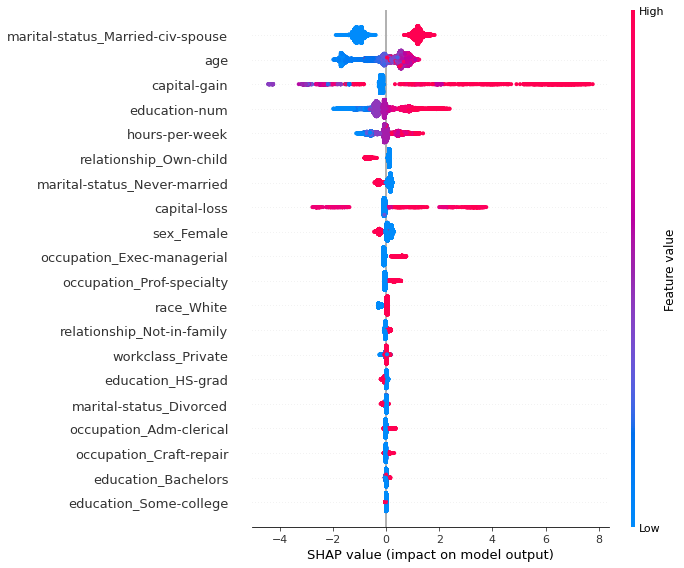

In [95]:
shap.summary_plot(shap_values, features=X_train, feature_names=X_train.columns)

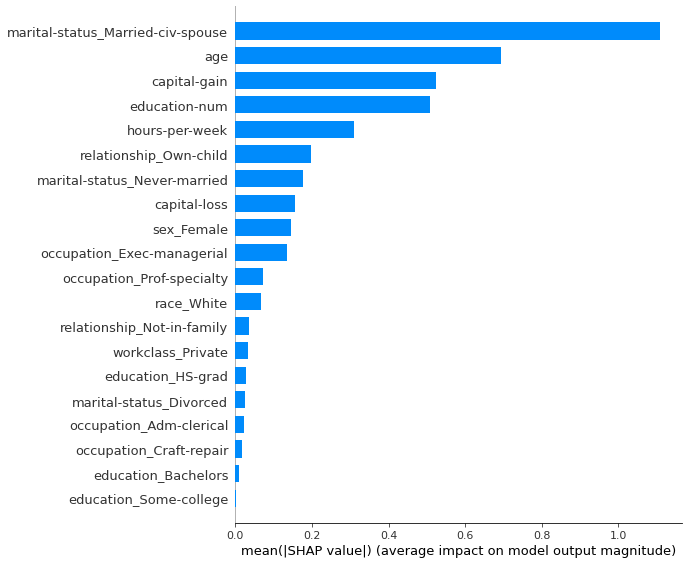

In [96]:
shap.summary_plot(shap_values, X_train, plot_type="bar")
plt.show()

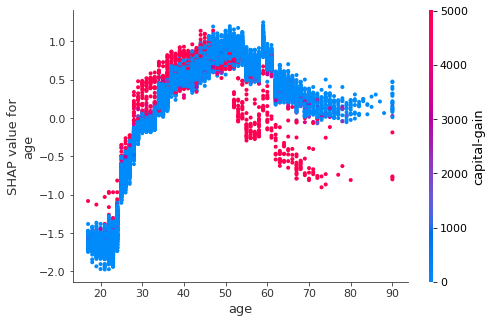

In [97]:
shap.dependence_plot('age', shap_values, X_train)

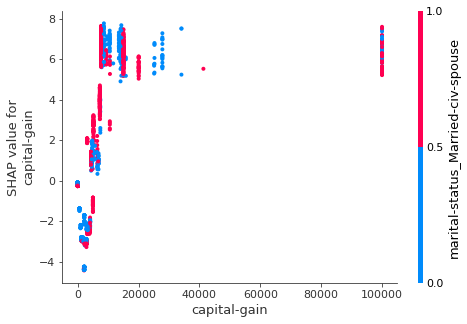

In [98]:
shap.dependence_plot('capital-gain', shap_values, X_train)

## Random Forest

In [36]:
# a basic model with default settings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

# try the followings: Xd2_n (Corr0.9 and Var on norm)0.544 , newXd (after RFE) 0.543, finalX (P_value) 0.548, finalX2 (VIF) 0.533

X_train, X_test, y_train, y_test = train_test_split(newX, y.values.ravel(), test_size=0.3, random_state=1971)
#Crossvalidation and parameter tuning in the same time - can be used the whole Xd and y
RFmodel = RandomForestClassifier(random_state=2019)
RFmodel.fit(X_train, y_train)
yg_pred = RFmodel.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
roc_aucg = auc(false_positive_rate, true_positive_rate)
roc_aucg

0.8812695682187567

In [37]:
RFmodel

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=2019,
                       verbose=0, warm_start=False)

## hyperparameters
- n_estimators = number of trees in the foreset
- max_features = max number of features considered for splitting a node
- max_depth = max number of levels in each decision tree
- min_samples_split = min number of data points placed in a node before the node is split
- min_samples_leaf = min number of data points allowed in a leaf node

In [107]:
#without crossvalidation
from sklearn.model_selection import ParameterGrid 
grid = { 
    "n_estimators": [50,100,200,300,400,500],
    "max_features": ['auto'],
    "max_depth": [2,3,6,9,12],
    "min_samples_split":[8, 12, 16, 20],
    "min_samples_leaf":[8,15,20],
    "random_state":[1971]}

rfc = RandomForestClassifier()
#from pprint import pprint 
#pprint(list(ParameterGrid(grid)))

In [108]:
test_scores = [] 
# loop through the parameter grid, set hyperparameters, save the scores 
for g in ParameterGrid(grid): 
    rfc.set_params(**g)  # ** is "unpacking" the dictionary 
    rfc.fit(X_train, y_train)
    yg_pred = rfc.predict_proba(X_test)[:,1]
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
    roc_aucg = auc(false_positive_rate, true_positive_rate)
    test_scores.append(roc_aucg) # find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores) 
print(test_scores[best_idx]) 
print(ParameterGrid(grid)[best_idx]) 



0.9109864211017351
{'random_state': 1971, 'n_estimators': 500, 'min_samples_split': 20, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 12}


In [109]:
test_scores = [] 
for g in ParameterGrid(grid):
    gbc.set_params(**g)  # ** is "unpacking" the dictionary
    gbc.fit(X_train, y_train)
    test_scores.append(gbc.score(X_test, y_test))

# Find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores)
print(test_scores[best_idx], ParameterGrid(grid)[best_idx])

0.8719418568942573 {'random_state': 1971, 'n_estimators': 400, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 3}


### THE CHOSEN ONE:

In [38]:
RFmodel3 = RandomForestClassifier(max_depth=12, n_estimators=500, max_features='auto', 
                                      random_state=1971, min_samples_split=20, 
                                      min_samples_leaf=8 )
RFmodel3.fit(X_train, y_train)
yg_pred3 = RFmodel3.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred3)
roc_aucg3 = auc(false_positive_rate, true_positive_rate)
print('ROC_AUC:',roc_aucg3, '\nAccuracy:',RFmodel3.score(X_test, y_test))

ROC_AUC: 0.9109864211017351 
Accuracy: 0.8593510082915344


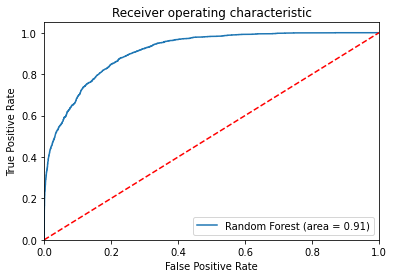

0.9109864211017351


In [39]:
#RF ROC CURVE
rf_roc_auc = roc_auc_score(y_test, RFmodel3.predict_proba(X_test)[:,1])
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, RFmodel3.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr_rf, tpr_rf, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('RF_ROC')
plt.show()
print(rf_roc_auc)

## Gradient Boosting Was the best with AUC 0.92

## RF SHAP  -  for some reason the GBM's link='logit' is not needed here and the structures are different as well

In [40]:
print(RFmodel3.predict_proba(np.array(X_train.iloc[10,:]).reshape(1, -1))[:,1])
print(X_train.iloc[10,:])

[0.01414255]
age                                  34
education-num                        10
capital-gain                          0
capital-loss                          0
hours-per-week                       40
workclass_Private                     1
education_Bachelors                   0
education_HS-grad                     0
education_Some-college                1
marital-status_Divorced               0
marital-status_Married-civ-spouse     0
marital-status_Never-married          1
occupation_Adm-clerical               1
occupation_Craft-repair               0
occupation_Exec-managerial            0
occupation_Prof-specialty             0
relationship_Not-in-family            0
relationship_Own-child                1
race_White                            1
sex_Female                            0
Name: 20154, dtype: int64


In [41]:
explainer2 = shap.TreeExplainer(RFmodel3)
shap_values2 = explainer2.shap_values(X_train)
i = 10
shap.force_plot(explainer2.expected_value[1], shap_values2[1][i], features=X_train.iloc[10,:], 
                feature_names=X_train.columns)

In [42]:
shap.force_plot(explainer2.expected_value[1], shap_values2[1][:100], X_test[:100])

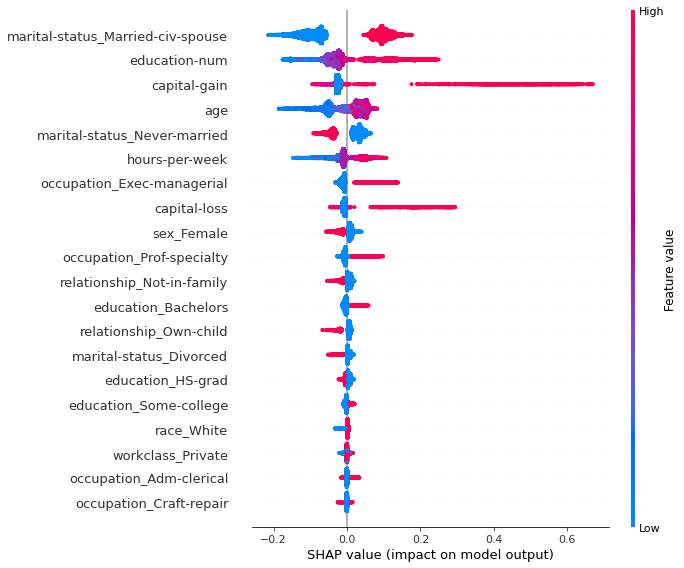

In [43]:
shap.summary_plot(shap_values2[1], X_train)

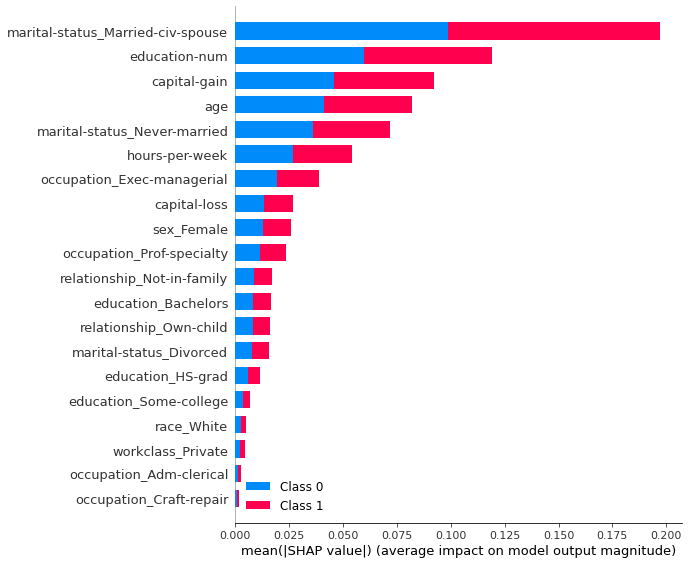

In [44]:
shap.summary_plot(shap_values2, X_train)

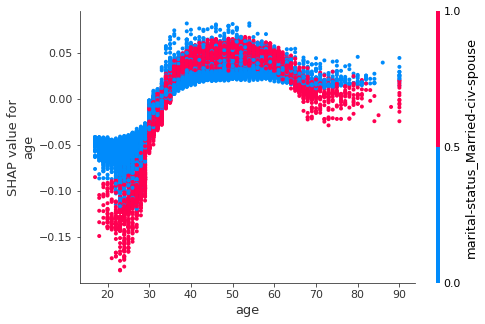

In [45]:
shap.dependence_plot('age', shap_values2[1], X_train)

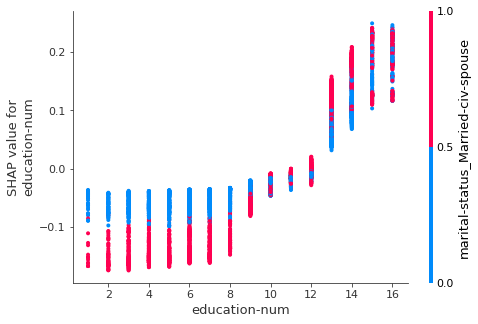

In [46]:
shap.dependence_plot('education-num', shap_values2[1], X_train)

## The size of the sample and the number of features don't suggest that deep neural networks would perform very well, but let's give it a try

In [47]:
from keras.models import Sequential
from keras.layers import Dense

Using TensorFlow backend.


In [48]:
X_train, X_test, y_train, y_test = train_test_split(newX, y.values.ravel(), test_size=0.3, random_state=1971)

In [53]:
X_train.shape

(22792, 20)

In [54]:
# define the keras model
model = Sequential()
model.add(Dense(12, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [55]:
# compile the keras model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [56]:
model.fit(X_train, y_train, epochs=300, batch_size=10)

Epoch 1/300
22792/22792 [==============================] - 10s 446us/step - loss: 1.7714 - accuracy: 0.7946
Epoch 2/300
22792/22792 [==============================] - 9s 415us/step - loss: 0.9349 - accuracy: 0.81700s - loss: 0
Epoch 3/300
22792/22792 [==============================] - 9s 410us/step - loss: 1.1307 - accuracy: 0.8204
Epoch 4/300
22792/22792 [==============================] - 9s 399us/step - loss: 0.8681 - accuracy: 0.8231
Epoch 5/300
22792/22792 [==============================] - 9s 400us/step - loss: 1.1104 - accuracy: 0.8253
Epoch 6/300
22792/22792 [==============================] - 9s 395us/step - loss: 0.7847 - accuracy: 0.8277
Epoch 7/300
22792/22792 [==============================] - 9s 395us/step - loss: 0.7085 - accuracy: 0.8322
Epoch 8/300
22792/22792 [==============================] - 9s 379us/step - loss: 0.7117 - accuracy: 0.8291
Epoch 9/300
22792/22792 [==============================] - 9s 392us/step - loss: 0.7436 - accuracy: 0.8318
Epoch 10/300
22792/22792

22792/22792 [==============================] - 7s 316us/step - loss: 0.3267 - accuracy: 0.8452
Epoch 77/300
22792/22792 [==============================] - 8s 353us/step - loss: 0.3263 - accuracy: 0.8449
Epoch 78/300
22792/22792 [==============================] - 7s 297us/step - loss: 0.3275 - accuracy: 0.8460
Epoch 79/300
22792/22792 [==============================] - 8s 344us/step - loss: 0.3264 - accuracy: 0.8460
Epoch 80/300
22792/22792 [==============================] - 7s 301us/step - loss: 0.3251 - accuracy: 0.8473
Epoch 81/300
22792/22792 [==============================] - 8s 337us/step - loss: 0.3247 - accuracy: 0.8477
Epoch 82/300
22792/22792 [==============================] - 7s 314us/step - loss: 0.3253 - accuracy: 0.8460
Epoch 83/300
22792/22792 [==============================] - 8s 331us/step - loss: 0.3245 - accuracy: 0.8471
Epoch 84/300
22792/22792 [==============================] - 7s 316us/step - loss: 0.3247 - accuracy: 0.8466
Epoch 85/300
22792/22792 [===============

22792/22792 [==============================] - 8s 369us/step - loss: 0.3211 - accuracy: 0.8491
Epoch 152/300
22792/22792 [==============================] - 9s 378us/step - loss: 0.3212 - accuracy: 0.8483
Epoch 153/300
22792/22792 [==============================] - 8s 361us/step - loss: 0.3219 - accuracy: 0.8489
Epoch 154/300
22792/22792 [==============================] - 9s 378us/step - loss: 0.3214 - accuracy: 0.8465
Epoch 155/300
22792/22792 [==============================] - 12s 518us/step - loss: 0.3413 - accuracy: 0.8481
Epoch 156/300
22792/22792 [==============================] - 12s 513us/step - loss: 0.3211 - accuracy: 0.8496
Epoch 157/300
22792/22792 [==============================] - 11s 489us/step - loss: 0.3211 - accuracy: 0.8497
Epoch 158/300
22792/22792 [==============================] - 9s 376us/step - loss: 0.3214 - accuracy: 0.8496
Epoch 159/300
22792/22792 [==============================] - ETA: 0s - loss: 0.3215 - accuracy: 0.84 - 8s 343us/step - loss: 0.3214 - accur

22792/22792 [==============================] - 9s 399us/step - loss: 0.3178 - accuracy: 0.8482
Epoch 226/300
22792/22792 [==============================] - 10s 449us/step - loss: 0.3190 - accuracy: 0.8494
Epoch 227/300
22792/22792 [==============================] - 8s 371us/step - loss: 0.3206 - accuracy: 0.8499
Epoch 228/300
22792/22792 [==============================] - 8s 369us/step - loss: 0.3188 - accuracy: 0.8501
Epoch 229/300
22792/22792 [==============================] - 12s 507us/step - loss: 0.3192 - accuracy: 0.8489
Epoch 230/300
22792/22792 [==============================] - 8s 359us/step - loss: 0.3193 - accuracy: 0.8491
Epoch 231/300
22792/22792 [==============================] - 9s 389us/step - loss: 0.3192 - accuracy: 0.8485
Epoch 232/300
22792/22792 [==============================] - 10s 424us/step - loss: 0.3191 - accuracy: 0.8508
Epoch 233/300
22792/22792 [==============================] - 11s 474us/step - loss: 0.3191 - accuracy: 0.8494
Epoch 234/300
22792/22792 [==

22792/22792 [==============================] - 8s 356us/step - loss: 0.3171 - accuracy: 0.8500
Epoch 300/300
22792/22792 [==============================] - 9s 380us/step - loss: 0.3176 - accuracy: 0.8493


In [57]:
# evaluate the keras model: 
_, accuracy = model.evaluate(X_test, y_test)
print('Accuracy: %.2f' % (accuracy*100))

9769/9769 [==============================] - 1s 69us/step
Accuracy: 84.73


#### with 150 epochs was weak, with 300 epochs it's mediocre

In [58]:
y_pred_k = model.predict(X_test).ravel()
fpr_k, tpr_k, thr_k = roc_curve(y_test, y_pred_k)

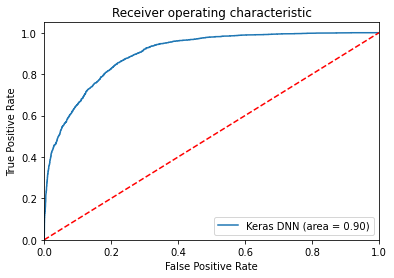

0.9005891875186205


In [59]:
keras_roc_auc = roc_auc_score(y_test, y_pred_k)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_k)
plt.figure()
plt.plot(fpr, tpr, label='Keras DNN (area = %0.2f)' % keras_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Keras_ROC')
plt.show()
print(keras_roc_auc)

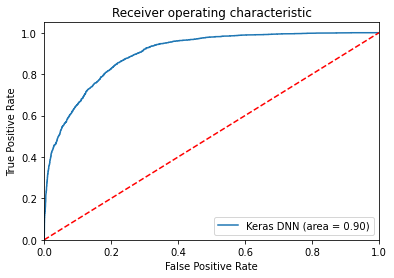

0.9005891875186205


In [60]:
keras_roc_auc = roc_auc_score(y_test, model.predict_proba(X_test))
fpr_dnn, tpr_dnn, thresholds_dnn = roc_curve(y_test, model.predict_proba(X_test))
plt.figure()
plt.plot(fpr_dnn, tpr_dnn, label='Keras DNN (area = %0.2f)' % keras_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Keras_ROC')
plt.show()
print(keras_roc_auc)

predict and predict proba give the same result seemingly it's different from sklearn!!!

## FINAL COMPARISON

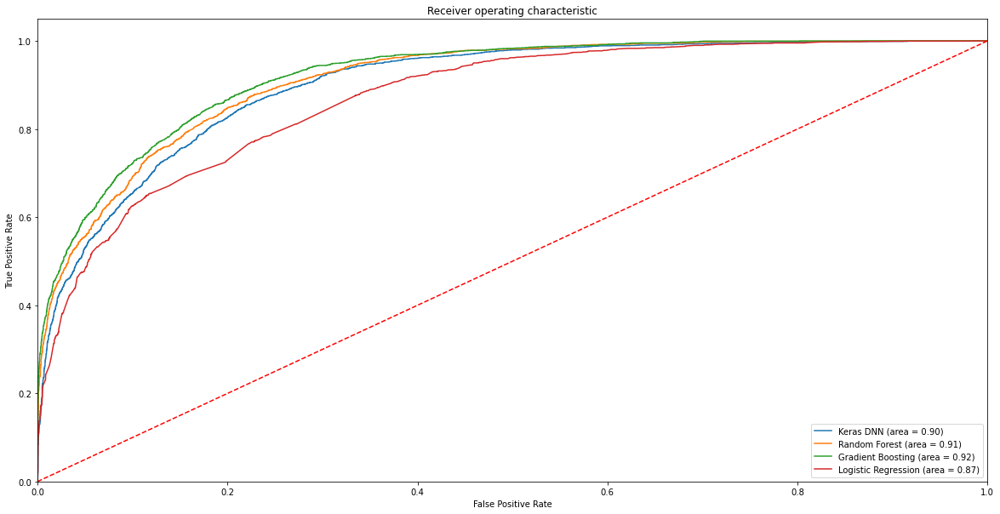

In [70]:
plt.figure(figsize=(20,10))
plt.plot(fpr_dnn, tpr_dnn, label='Keras DNN (area = %0.2f)' % keras_roc_auc)
plt.plot(fpr_rf, tpr_rf, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (area = %0.2f)' % gb_roc_auc)
plt.plot(fpr_log, tpr_log, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Keras_ROC')
plt.show()
#print(keras_roc_auc)

    Gradient Boosting is definitely the best from Gini perspective, but the RF seems fine too.
    On the other hand Logistic regression has the result with less features!!!

## XGBoost

In [71]:
from xgboost import XGBClassifier
from xgboost import plot_importance
import xgboost

In [72]:
X_train, X_test, y_train, y_test = train_test_split(newX, y.values.ravel(), test_size=0.3, random_state=1971)

In [73]:
# fit model on the training data
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [74]:
y_pred_xgb = xgb.predict(X_test)
# evaluate the xgb model: 
accuracy = accuracy_score(y_test, y_pred_xgb)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 86.31


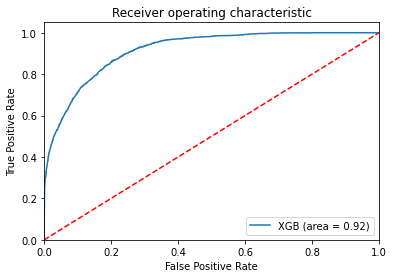

0.915813707065622


In [75]:
xgb_roc_auc = roc_auc_score(y_test, xgb.predict_proba(X_test)[:,1])
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, xgb.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr_xgb, tpr_xgb, label='XGB (area = %0.2f)' % xgb_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('XGB_ROC')
plt.show()
print(xgb_roc_auc)

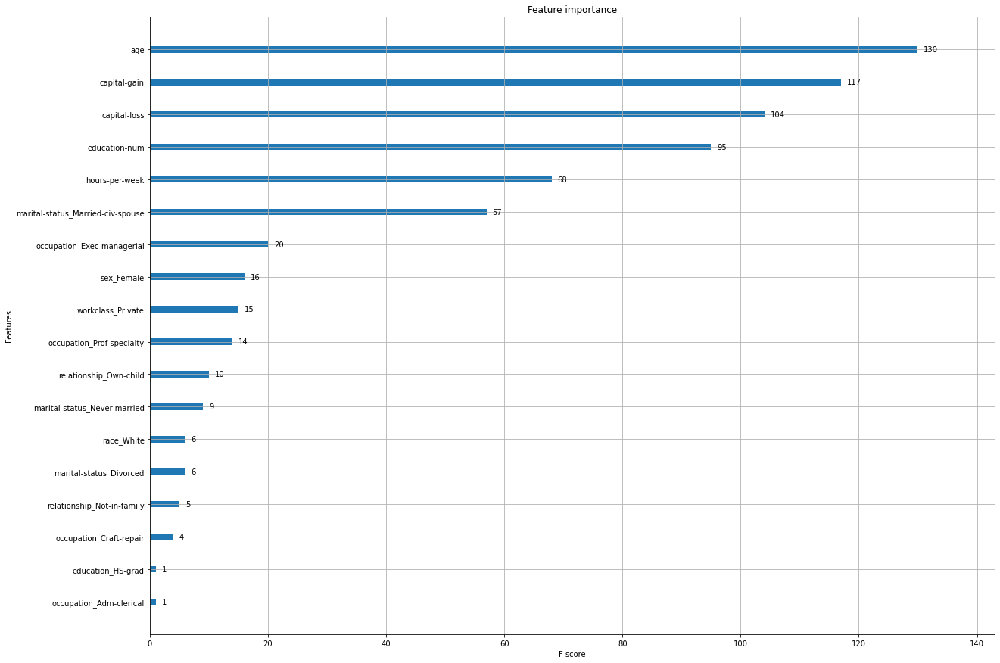

In [76]:
plt.figure(figsize=(20,15))
#xgb.feature_importances_
plot_importance(xgb, ax=plt.gca())
plt.show()

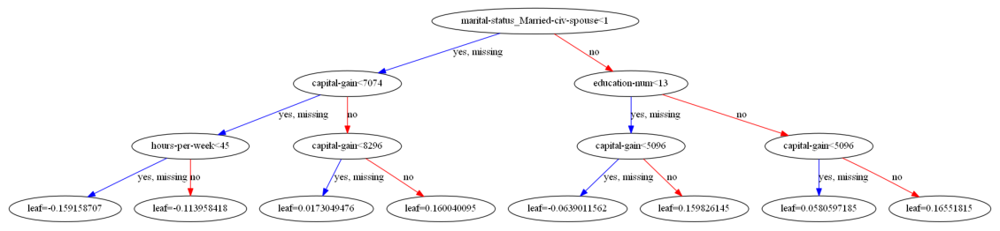

In [77]:
plt.figure(figsize=(20,25))
xgboost.plot_tree(xgb,num_trees=2 ,ax=plt.gca())
plt.show()

### Parameter tuning wih the sklearn API

In [78]:
xgb_skl = xgboost.sklearn.XGBClassifier(nthread=-1, seed=42)

In [79]:
xgb_skl.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=-1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

In [80]:
y_pred_xgb = xgb_skl.predict(X_test)
# evaluate the xgb model: 
accuracy = accuracy_score(y_test, y_pred_xgb)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 86.31


In [81]:

xgb_skl = xgboost.sklearn.XGBClassifier(nthread=-1, seed=42)
eval_set = [(X_train, y_train), (X_test, y_test)]
eval_metric = ["auc","error"]
%time xgb_skl.fit(X_train, y_train, eval_metric=eval_metric, eval_set=eval_set, verbose=True)

[0]	validation_0-auc:0.861871	validation_0-error:0.157731	validation_1-auc:0.859836	validation_1-error:0.152319
[1]	validation_0-auc:0.862622	validation_0-error:0.157731	validation_1-auc:0.860773	validation_1-error:0.152319
[2]	validation_0-auc:0.867153	validation_0-error:0.157906	validation_1-auc:0.865179	validation_1-error:0.152319
[3]	validation_0-auc:0.877202	validation_0-error:0.157906	validation_1-auc:0.875786	validation_1-error:0.152319
[4]	validation_0-auc:0.878672	validation_0-error:0.157906	validation_1-auc:0.877429	validation_1-error:0.152319
[5]	validation_0-auc:0.880701	validation_0-error:0.157906	validation_1-auc:0.878871	validation_1-error:0.152319
[6]	validation_0-auc:0.881939	validation_0-error:0.157906	validation_1-auc:0.879682	validation_1-error:0.152319
[7]	validation_0-auc:0.88593	validation_0-error:0.157906	validation_1-auc:0.883155	validation_1-error:0.152319
[8]	validation_0-auc:0.887792	validation_0-error:0.157336	validation_1-auc:0.884669	validation_1-error:0.

[73]	validation_0-auc:0.919469	validation_0-error:0.140444	validation_1-auc:0.912754	validation_1-error:0.138806
[74]	validation_0-auc:0.919626	validation_0-error:0.1404	validation_1-auc:0.912898	validation_1-error:0.138909
[75]	validation_0-auc:0.919747	validation_0-error:0.140225	validation_1-auc:0.912979	validation_1-error:0.139114
[76]	validation_0-auc:0.920106	validation_0-error:0.139918	validation_1-auc:0.913372	validation_1-error:0.138806
[77]	validation_0-auc:0.920196	validation_0-error:0.139874	validation_1-auc:0.913391	validation_1-error:0.138602
[78]	validation_0-auc:0.920519	validation_0-error:0.139479	validation_1-auc:0.913785	validation_1-error:0.13809
[79]	validation_0-auc:0.920617	validation_0-error:0.139479	validation_1-auc:0.913899	validation_1-error:0.137885
[80]	validation_0-auc:0.920917	validation_0-error:0.139435	validation_1-auc:0.914203	validation_1-error:0.137783
[81]	validation_0-auc:0.920967	validation_0-error:0.139523	validation_1-auc:0.914225	validation_1-e

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=-1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

In [82]:
grid = { 
    "learning_rate": [0.01, 0.1,0.25],
    "n_estimators":[ 80, 100, 150],
    "max_depth":[3,4,5],
    "min_child_weight":[1,2,3],
    "subsample":[0.8, 1.0],
    "colsample_bytree":[0.8,1],   # number of columns (features) used by each tree
    "gamma":[0,1,5],  # regularization parameter
    "random_state":[1971]} 

In [83]:
xgb_skl = xgboost.sklearn.XGBClassifier()

test_scores = [] 
for g in ParameterGrid(grid):
    xgb_skl.set_params(**g)  # ** is "unpacking" the dictionary
    xgb_skl.fit(X_train, y_train)
    test_scores.append(xgb_skl.score(X_test, y_test))

# Find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores)
print(test_scores[best_idx], ParameterGrid(grid)[best_idx])

0.8723513153854028 {'subsample': 1.0, 'random_state': 1971, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.25, 'gamma': 0, 'colsample_bytree': 1}


In [84]:
test_scores = [] 
# loop through the parameter grid, set hyperparameters, save the scores 
for g in ParameterGrid(grid): 
    xgb_skl.set_params(**g)  # ** is "unpacking" the dictionary 
    xgb_skl.fit(X_train, y_train)
    yg_pred = xgb_skl.predict_proba(X_test)[:,1]
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, yg_pred)
    roc_aucg = auc(false_positive_rate, true_positive_rate)
    test_scores.append(roc_aucg) # find best hyperparameters from the test score and print
best_idx = np.argmax(test_scores) 
print(test_scores[best_idx]) 
print(ParameterGrid(grid)[best_idx]) 

0.9234709313522235
{'subsample': 1.0, 'random_state': 1971, 'n_estimators': 150, 'min_child_weight': 2, 'max_depth': 4, 'learning_rate': 0.25, 'gamma': 1, 'colsample_bytree': 0.8}


In [85]:
xgb_skl = xgboost.sklearn.XGBClassifier(subsample= 1.0, random_state= 1971, n_estimators= 150, 
                                        min_child_weight= 2, max_depth= 4, learning_rate= 0.25, gamma= 1,
                                        colsample_bytree= 0.8)

xgb_skl.fit(X_train, y_train)
xgb_pred4 = xgb_skl.predict_proba(X_test)[:,1]

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, xgb_pred4)
roc_aucxgb = auc(false_positive_rate, true_positive_rate)
print('ROC_AUC:',roc_aucxgb, '\nAccuracy:',xgb_skl.score(X_test, y_test))

ROC_AUC: 0.9234709313522235 
Accuracy: 0.8685638243423073


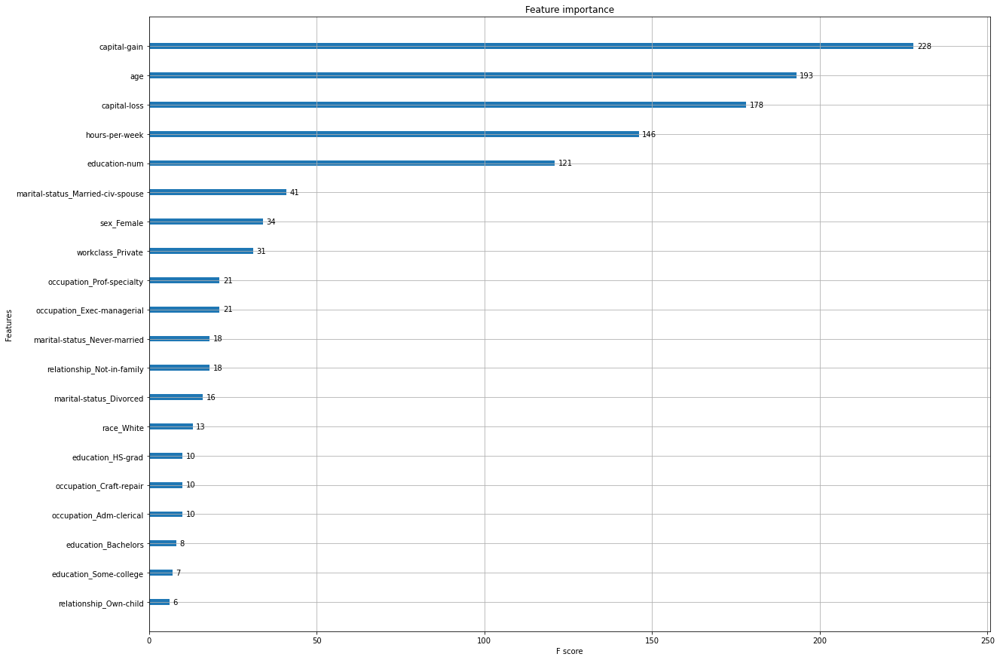

In [86]:
plt.figure(figsize=(20,15))
#xgb.feature_importances_
plot_importance(xgb_skl, ax=plt.gca())
plt.show()

In [88]:
explainer3 = shap.TreeExplainer(xgb_skl)
shap_values3 = explainer3.shap_values(X_train)

In [99]:
shap_values3[:100]

array([[-1.6154506 , -0.37062085, -0.15185055, ...,  0.02232791,
         0.03264118, -0.34244695],
       [ 0.45131934, -0.42884505, -2.783222  , ...,  0.01606578,
         0.04550464, -0.28115335],
       [ 0.57022077, -0.35538995, -0.16480187, ...,  0.00966214,
         0.02436718,  0.03065224],
       ...,
       [-0.14859904, -0.36651605,  5.8442264 , ...,  0.02543834,
         0.04371258,  0.01068939],
       [ 0.21527095,  0.71129274, -0.16266482, ...,  0.01449833,
         0.02456833,  0.02354988],
       [-2.0633578 , -0.42895833, -0.152024  , ...,  0.02414301,
         0.04088609,  0.20389621]], dtype=float32)

In [94]:
i = 10
shap.force_plot(explainer3.expected_value, shap_values3[i], features=X_train.iloc[i,:], 
                feature_names=X_train.columns, link = 'logit')

In [100]:
shap.force_plot(explainer3.expected_value, shap_values3[:100], X_test[:100])

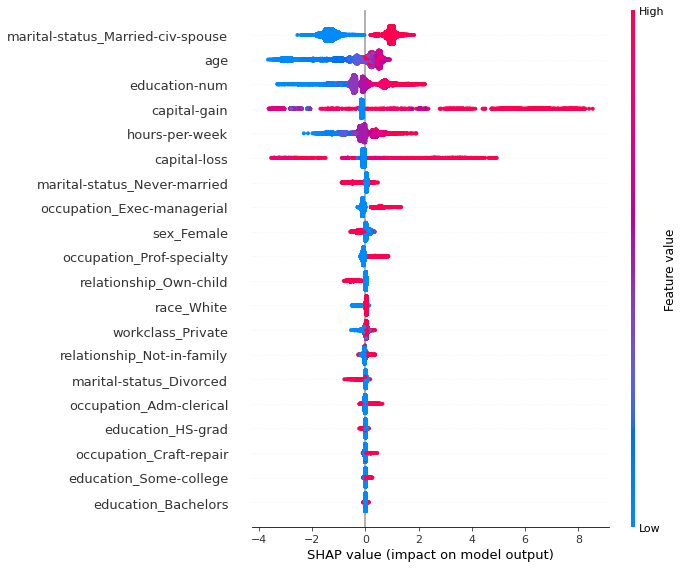

In [101]:
shap.summary_plot(shap_values3, X_train)

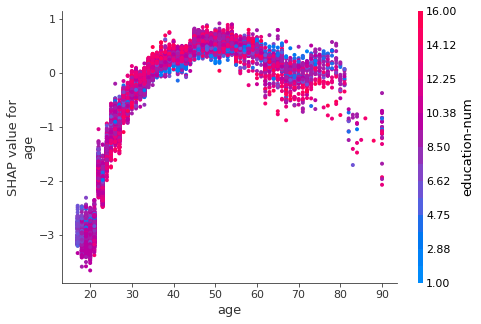

In [103]:
shap.dependence_plot('age', shap_values3, X_train)

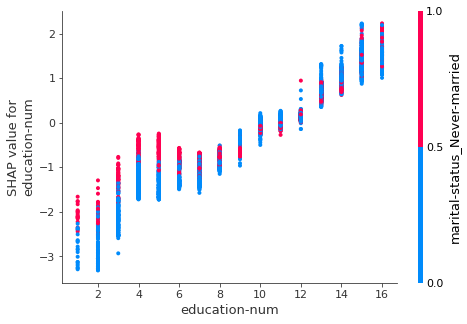

In [104]:
shap.dependence_plot('education-num', shap_values3, X_train)

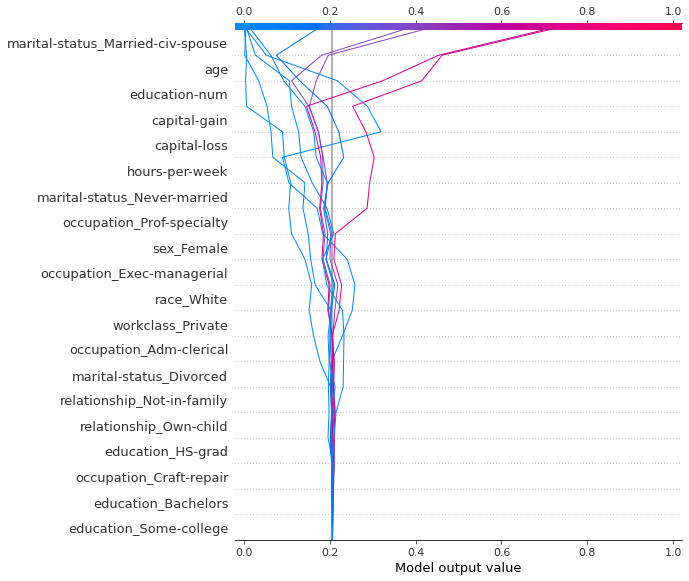

In [107]:
# 50 sample
shap.decision_plot(explainer3.expected_value, shap_values3[:10,:], X_test.columns, link='logit')
# https://slundberg.github.io/shap/notebooks/plots/decision_plot.html